In [23]:
from sklearn.datasets import fetch_openml

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import sklearn.linear_model as skl_lm
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score

from sklearn.model_selection import train_test_split, LeaveOneOut, KFold, cross_val_score
from sklearn.preprocessing import PolynomialFeatures

from sklearn import utils
from sklearn import preprocessing
from sklearn import neighbors
from pandas import read_csv

from sklearn import preprocessing
import copy 
import csv
kfld = KFold(n_splits=3,random_state=42)

In [39]:
data = read_csv('data/ethylene_methane.txt',delim_whitespace=True)
data2 = read_csv('data/ethylene_methane.txt',delim_whitespace=True)

ppm = data['Methane(ppm)'].unique()
data.head(12)

,Time(sec),Methane(ppm),Ethylene(ppm),sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,sensor8,sensor9,sensor10,sensor11,sensor12,sensor13,sensor14,sensor15,sensor16
0,0.00,0.0,0.0,-41.98,2067.64,-37.13,2.28,8.63,-26.62,-8.46,-0.33,3437.73,2728.14,4054.03,4007.89,4478.27,5056.98,3639.09,3128.49
1,0.01,0.0,0.0,-46.50,2067.88,-28.56,13.69,-12.35,-25.81,-5.04,-5.04,3432.44,2734.47,4038.62,4019.40,4496.72,5051.81,3636.97,3115.03
2,0.02,0.0,0.0,-36.16,2055.81,-10.89,8.63,-2.93,-30.34,-9.27,-2.12,3438.61,2719.97,4030.92,4025.48,4489.54,5057.35,3641.81,3105.24
3,0.03,0.0,0.0,-50.36,2053.68,-31.96,-0.65,-8.29,-21.60,7.98,2.28,3429.51,2720.50,4040.22,4000.87,4485.44,5049.60,3642.72,3124.84
4,0.04,0.0,0.0,-37.30,2081.17,-36.16,3.26,5.05,-26.14,-7.48,-0.65,3436.85,2719.71,4029.64,4007.25,4499.12,5057.35,3674.30,3147.59
5,0.05,0.0,0.0,-48.43,2058.64,-32.61,18.59,9.61,-28.89,-12.19,0.65,3463.35,2748.74,4037.97,4023.88,4486.47,5058.09,3650.60,3111.96
6,0.06,0.0,0.0,-46.17,2065.99,-33.74,7.82,-2.12,-38.10,10.59,2.93,3426.87,2731.83,4027.72,3996.72,4507.33,5056.61,3644.54,3122.32
7,0.07,0.0,0.0,-42.78,2067.64,-32.28,12.87,1.63,-33.58,-13.65,10.43,3413.97,2735.79,4038.94,4002.46,4499.80,5065.84,3646.36,3128.21
8,0.08,0.0,0.0,-40.85,2061.72,-34.87,3.42,-0.65,-30.99,-8.94,-0.33,3432.15,2741.34,4054.67,4003.42,4509.39,5079.15,3666.39,3135.78
9,0.09,0.0,0.0,-55.68,2079.51,-33.09,6.68,-1.79,-30.34,-9.76,7.49,3437.14,2722.34,4046.64,3985.57,4493.64,5064.73,3678.87,3122.32


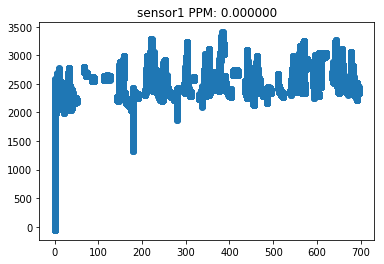

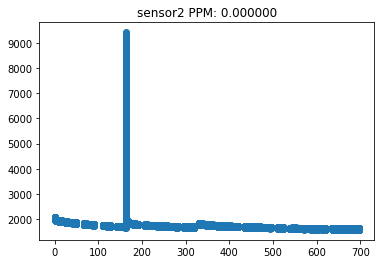

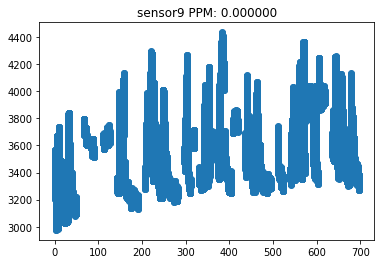

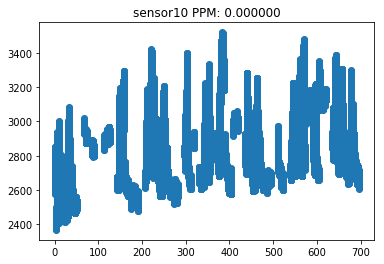

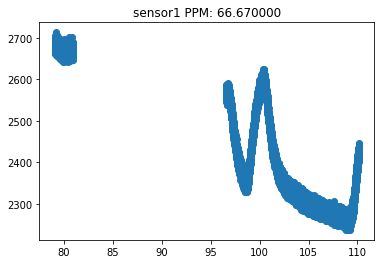

...

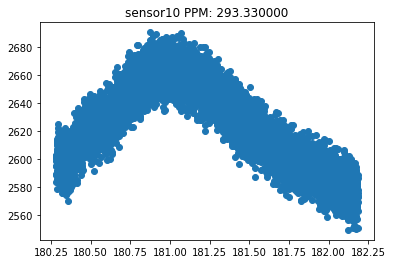

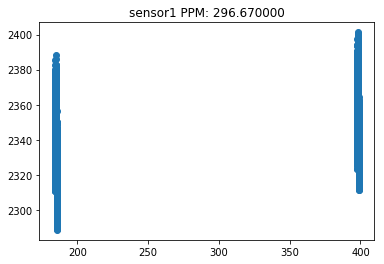

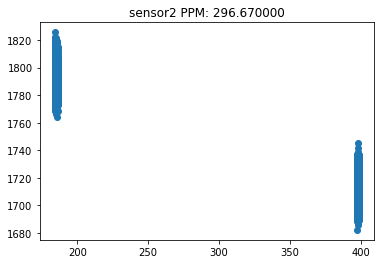

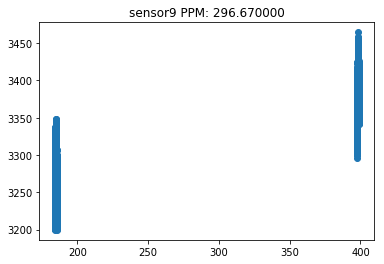

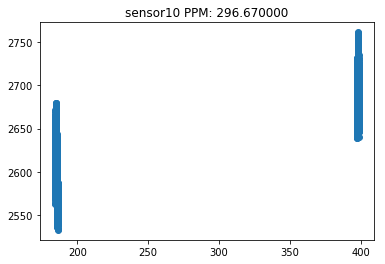

In [25]:
#TGS2602
for i in np.sort(ppm): 
    for j in ["sensor1","sensor2","sensor9","sensor10"]:
        plt.figure()
        data2 = data[data["Methane(ppm)"] == i]
        plt.title('%s ' %j +'PPM: %f' %i)
        plt.scatter(data2["Time(sec)"]/60,data2[j])
        #data2.plot(kind="scatter", x="Time(sec)", y="sensor1")

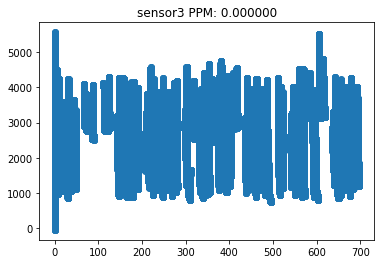

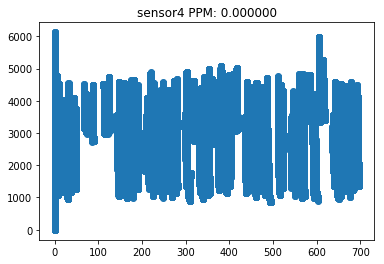

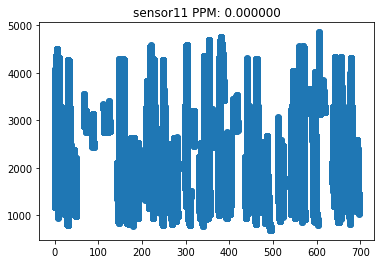

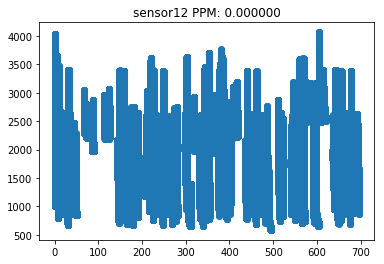

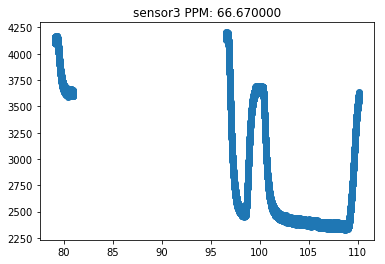

...

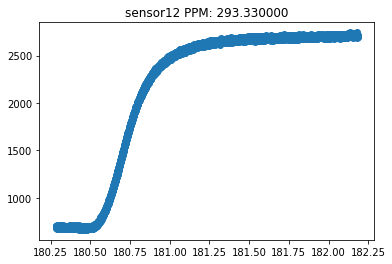

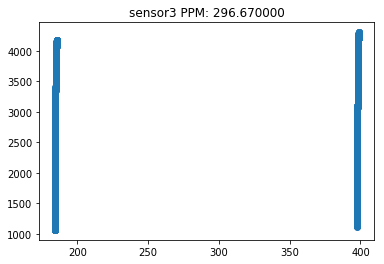

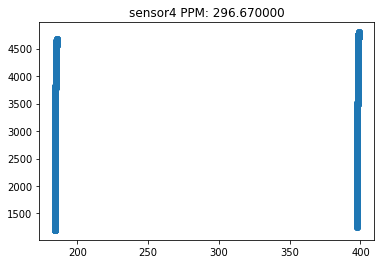

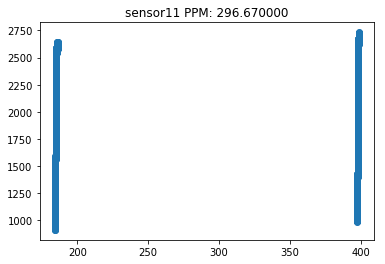

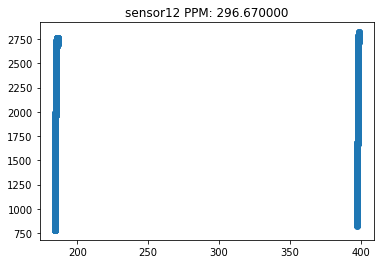

In [26]:
#TGS2600
for i in np.sort(ppm): 
    for j in ["sensor3","sensor4","sensor11","sensor12"]:
        plt.figure()
        data2 = data[data["Methane(ppm)"] == i]
        plt.title('%s ' %j +'PPM: %f' %i)
        plt.scatter(data2["Time(sec)"],data2[j])

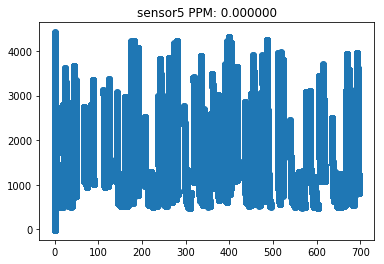

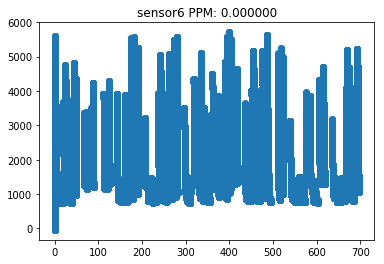

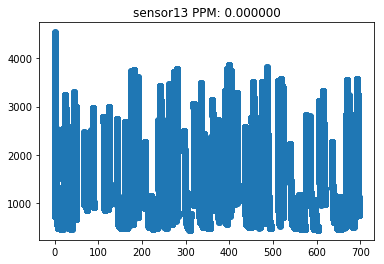

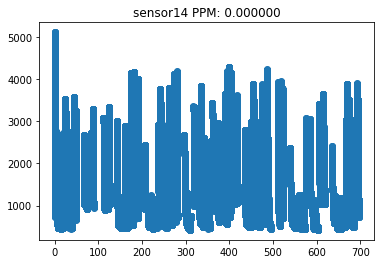

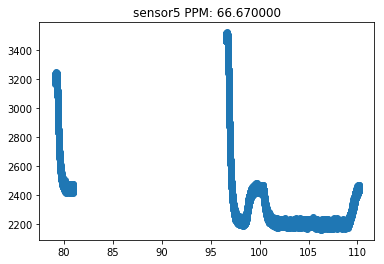

...

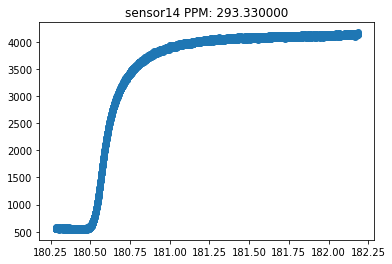

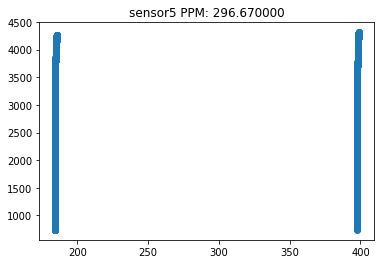

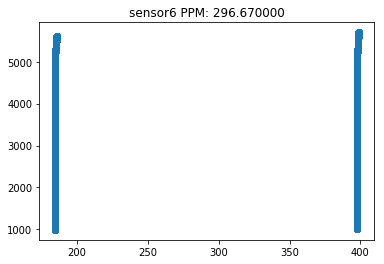

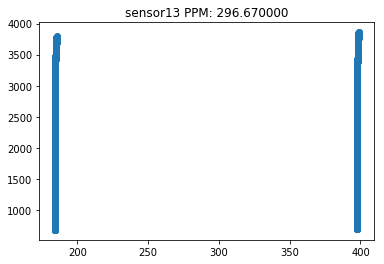

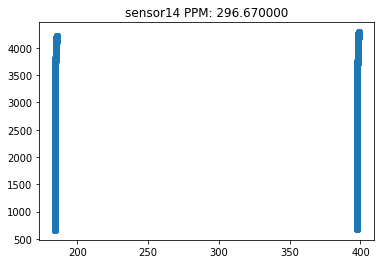

In [27]:
#TGS2610
for i in np.sort(ppm): 
    for j in ["sensor5","sensor6","sensor13","sensor14"]:
        plt.figure()
        data2 = data[data["Methane(ppm)"] == i]
        plt.title('%s ' %j +'PPM: %f' %i)
        plt.scatter(data2["Time(sec)"],data2[j])

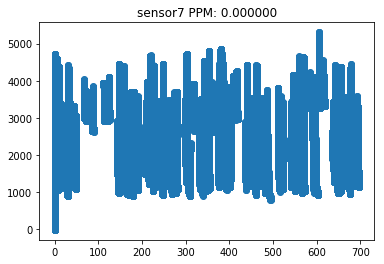

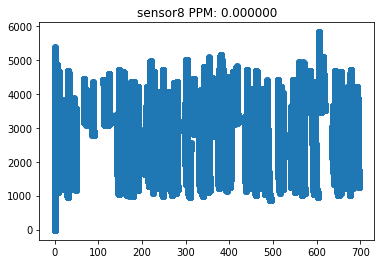

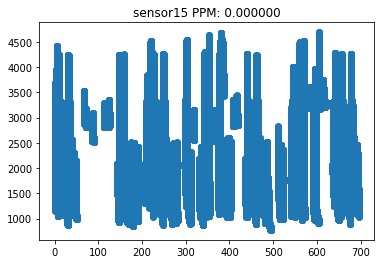

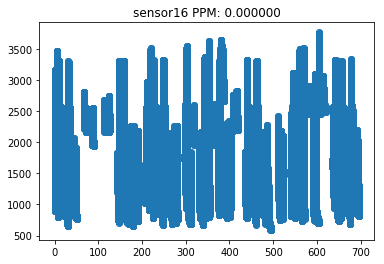

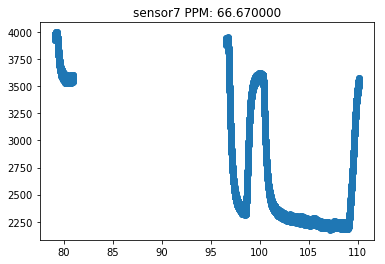

...

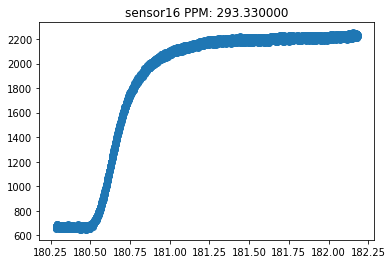

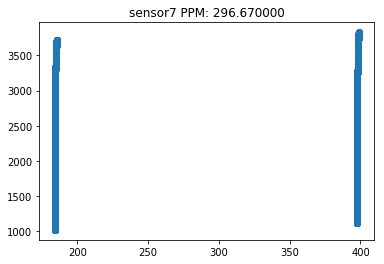

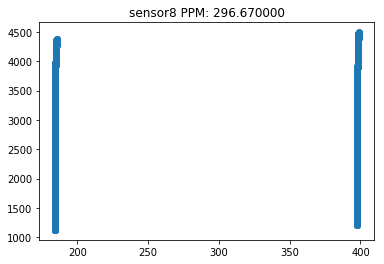

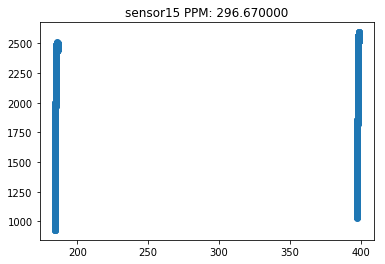

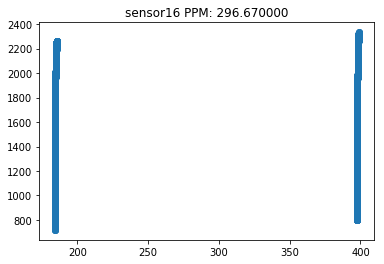

In [29]:
#TGS2620
for i in np.sort(ppm): 
    for j in ["sensor7","sensor8","sensor15","sensor16"]:
        plt.figure()
        data2 = data[data["Methane(ppm)"] == i]
        plt.title('%s ' %j +'PPM: %f' %i)
        plt.scatter(data2["Time(sec)"],data2[j])

In [28]:
sensor_data = data.drop(columns = ['Methane(ppm)','Ethylene(ppm)'])
sensor_data.corr()

,Time(sec),sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,sensor8,sensor9,sensor10,sensor11,sensor12,sensor13,sensor14,sensor15,sensor16
Time(sec),1.000000,0.325893,-0.619647,-0.049409,-0.055903,-0.111002,-0.105951,-0.036904,-0.046773,0.331957,0.342541,-0.001777,-0.042225,-0.107975,-0.111157,0.001696,-0.013905
sensor1,0.325893,1.000000,-0.265457,0.542035,0.517309,-0.007997,-0.049581,0.607853,0.550246,0.968722,0.969346,0.753019,0.630892,-0.016571,-0.006873,0.745483,0.695299
sensor2,-0.619647,-0.265457,1.000000,-0.005251,-0.001264,0.046230,0.046176,-0.015265,-0.008755,-0.264761,-0.269184,-0.034037,-0.008078,0.046804,0.048559,-0.037632,-0.027482
sensor3,-0.049409,0.542035,-0.005251,1.000000,0.999062,0.731055,0.691825,0.982586,0.989380,0.594828,0.549763,0.914206,0.983286,0.721525,0.732392,0.894333,0.937476
sensor4,-0.055903,0.517309,-0.001264,0.999062,1.000000,0.757826,0.719986,0.975786,0.986610,0.571084,0.524924,0.897211,0.975473,0.748405,0.758851,0.875470,0.923054
sensor5,-0.111002,-0.007997,0.046230,0.731055,0.757826,1.000000,0.997572,0.639524,0.712419,0.049530,-0.003966,0.402772,0.607913,0.998335,0.998563,0.377419,0.483027
sensor6,-0.105951,-0.049581,0.046176,0.691825,0.719986,0.997572,1.000000,0.598874,0.675369,0.007560,-0.044395,0.352848,0.564077,0.997141,0.996410,0.329066,0.437546
sensor7,-0.036904,0.607853,-0.015265,0.982586,0.975786,0.639524,0.598874,1.000000,0.994842,0.655800,0.616637,0.951181,0.993048,0.631561,0.642433,0.951269,0.980856
sensor8,-0.046773,0.550246,-0.008755,0.989380,0.986610,0.712419,0.675369,0.994842,1.000000,0.601374,0.558944,0.917703,0.983283,0.705171,0.714931,0.916020,0.957101
sensor9,0.331957,0.968722,-0.264761,0.594828,0.571084,0.049530,0.007560,0.655800,0.601374,1.000000,0.996016,0.793539,0.682194,0.044642,0.055672,0.784209,0.739470


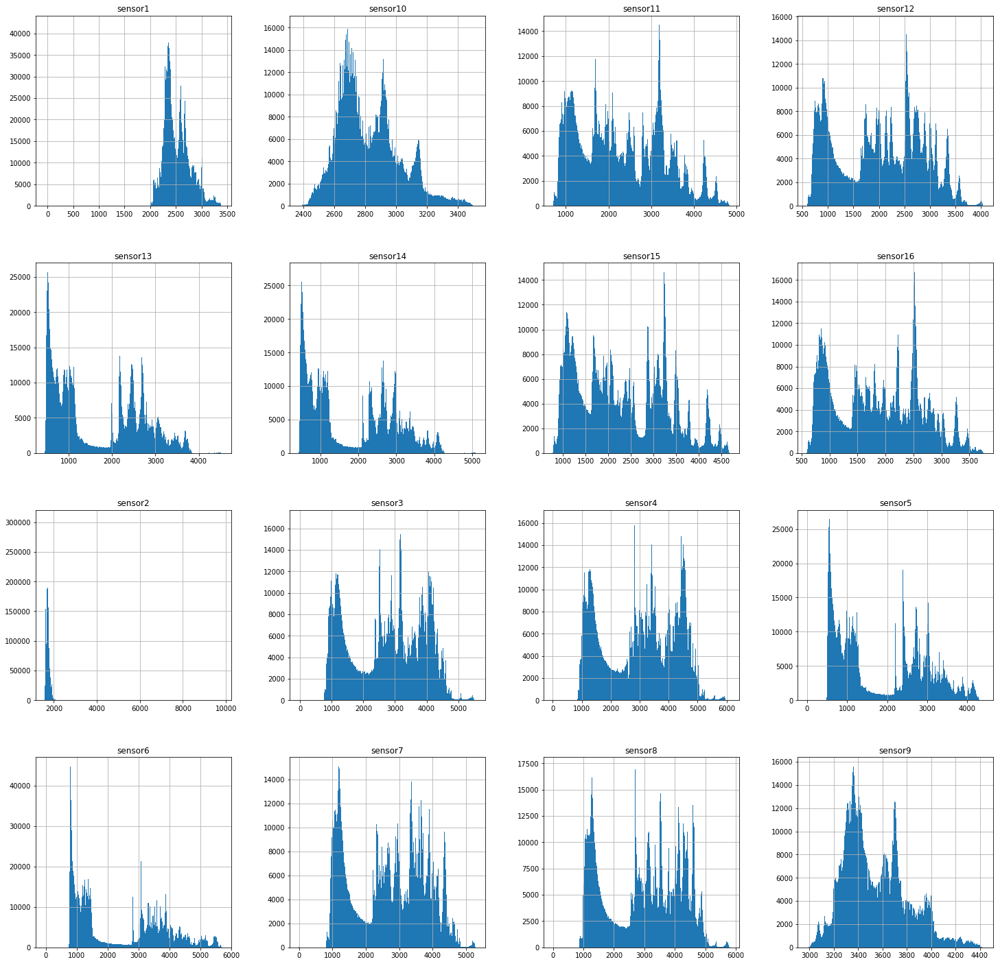

In [15]:
sensor_data.hist(bins=1000,figsize=(25,25))
plt.show()

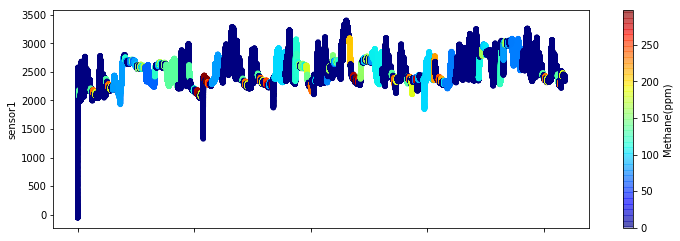

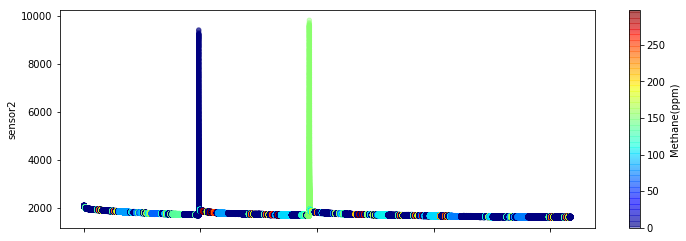

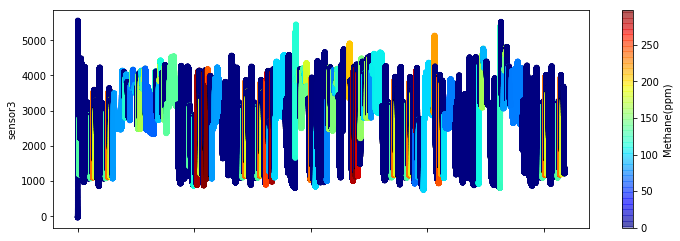

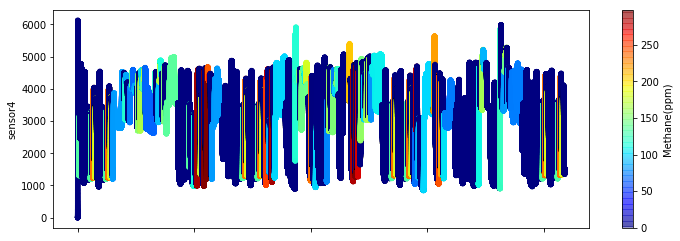

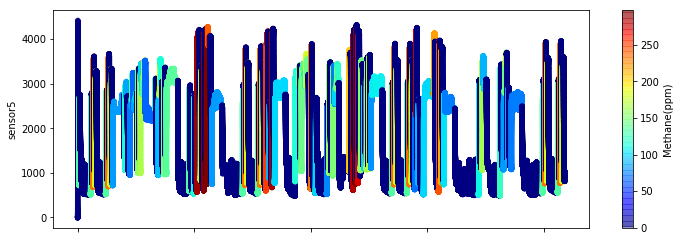

...

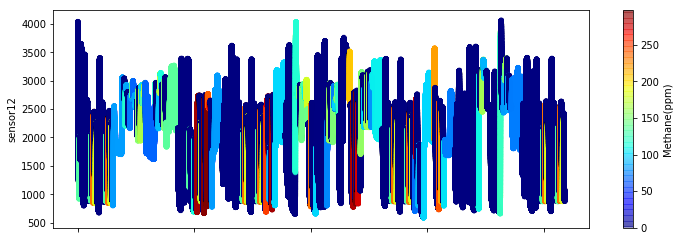

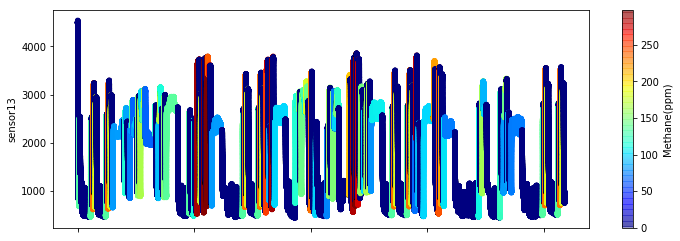

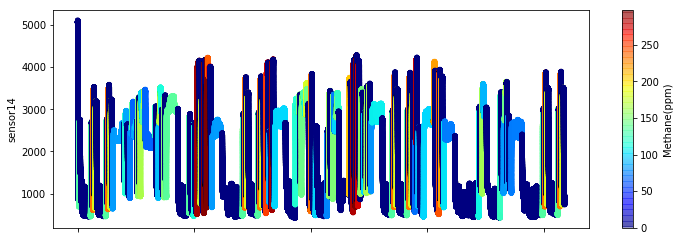

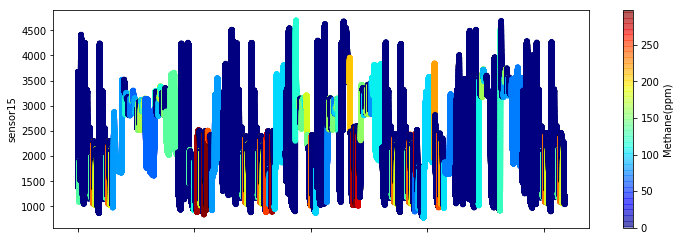

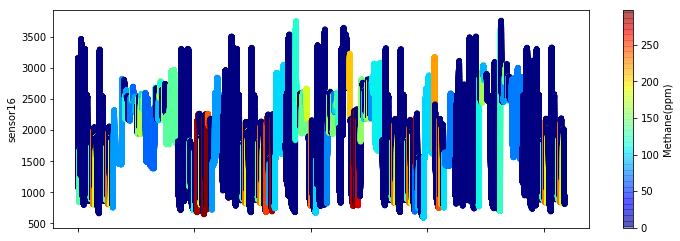

In [9]:
sensor_name = [ 'sensor1']#, 'sensor2','sensor3', 'sensor4', 'sensor5','sensor6', 'sensor7', 'sensor8','sensor9','sensor10', 'sensor11','sensor12', 'sensor13', 'sensor14', 'sensor15', 'sensor16'

for k in sensor_name:
    data.plot(kind="scatter", x='Time(sec)', y=k, alpha=0.4,c='Methane(ppm)', cmap=plt.get_cmap('jet'), colorbar=True,figsize=(12, 4))
    plt.show


In [7]:
sensor_name = [ 'sensor1']

for k in sensor_name:
    data[k]=data[k].rolling(window=5).mean() #rolling has the the window starting at the right edge by default

data = data.dropna()
data.head(12)

,Time(sec),Methane(ppm),Ethylene(ppm),sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,sensor8,sensor9,sensor10,sensor11,sensor12,sensor13,sensor14,sensor15,sensor16
12,0.12,0.0,0.0,-44.80664,2067.88,-27.75,7.17,2.44,-28.08,-15.28,2.77,3449.50,2734.47,4052.42,4002.14,4474.18,5055.87,3643.33,3118.11
13,0.13,0.0,0.0,-45.39888,2064.56,-25.00,11.90,11.90,-27.92,-7.97,-1.95,3439.20,2736.32,4048.57,4000.55,4487.83,5037.45,3636.06,3127.64
14,0.14,0.0,0.0,-45.81192,2072.86,-26.14,10.43,7.33,-19.82,-6.02,-11.87,3430.98,2733.15,4023.24,3979.84,4489.20,5069.16,3659.71,3125.68
15,0.15,0.0,0.0,-46.19160,2057.93,-25.81,15.00,-0.49,-30.83,-10.24,5.86,3434.50,2735.79,4014.60,3989.71,4487.83,5071.38,3638.18,3125.12
16,0.16,0.0,0.0,-46.57776,2062.43,-32.28,2.28,4.07,-25.97,-3.74,0.16,3435.68,2721.55,4037.33,3999.27,4510.76,5056.24,3641.51,3126.24
17,0.17,0.0,0.0,-46.99112,2065.99,-33.58,11.08,-0.16,-25.81,-9.59,-1.46,3434.50,2737.11,4033.16,4030.92,4499.12,5062.88,3653.64,3118.67
18,0.18,0.0,0.0,-47.29608,2060.54,-32.45,-1.14,-6.02,-26.14,-6.99,2.28,3433.33,2727.08,4043.75,4009.49,4502.54,5059.93,3640.60,3130.45
19,0.19,0.0,0.0,-47.68464,2071.44,-30.83,4.23,1.79,-29.53,-10.41,8.14,3450.97,2744.51,4020.99,3995.76,4496.04,5072.86,3664.87,3133.26
20,0.20,0.0,0.0,-47.97496,2064.09,-33.90,-1.14,-3.09,-28.89,-6.51,5.54,3434.50,2738.43,4052.74,4002.14,4476.23,5056.61,3650.91,3130.73
21,0.21,0.0,0.0,-48.09104,2068.59,-28.89,4.23,-3.74,-29.21,-0.16,11.08,3436.56,2735.26,4035.09,4020.99,4515.90,5061.78,3644.24,3142.53


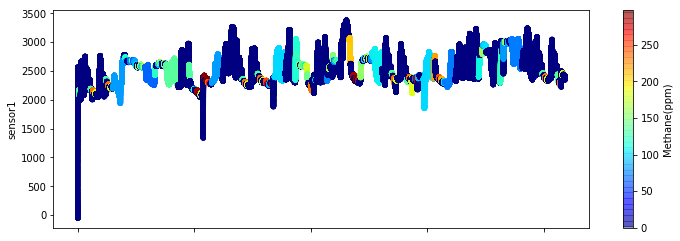

In [6]:
for k in sensor_name:
    data.plot(kind="scatter", x='Time(sec)', y=k, alpha=0.4,c='Methane(ppm)', cmap=plt.get_cmap('jet'), colorbar=True,figsize=(12, 4))
    plt.show

In [36]:
df = data.copy()
df['sensor1']

TypeError: list indices must be integers or slices, not str

In [40]:
sensor_name = [ 'sensor1']

for k in sensor_name:
    data[k]=data2[k].rolling(window=5).mean() #rolling has the the window starting at the right edge by default

data = data.dropna()
data.head(12)

,Time(sec),Methane(ppm),Ethylene(ppm),sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,sensor8,sensor9,sensor10,sensor11,sensor12,sensor13,sensor14,sensor15,sensor16
4,0.04,0.0,0.0,-42.460,2081.17,-36.16,3.26,5.05,-26.14,-7.48,-0.65,3436.85,2719.71,4029.64,4007.25,4499.12,5057.35,3674.30,3147.59
5,0.05,0.0,0.0,-43.750,2058.64,-32.61,18.59,9.61,-28.89,-12.19,0.65,3463.35,2748.74,4037.97,4023.88,4486.47,5058.09,3650.60,3111.96
6,0.06,0.0,0.0,-43.684,2065.99,-33.74,7.82,-2.12,-38.10,10.59,2.93,3426.87,2731.83,4027.72,3996.72,4507.33,5056.61,3644.54,3122.32
7,0.07,0.0,0.0,-45.008,2067.64,-32.28,12.87,1.63,-33.58,-13.65,10.43,3413.97,2735.79,4038.94,4002.46,4499.80,5065.84,3646.36,3128.21
8,0.08,0.0,0.0,-43.106,2061.72,-34.87,3.42,-0.65,-30.99,-8.94,-0.33,3432.15,2741.34,4054.67,4003.42,4509.39,5079.15,3666.39,3135.78
9,0.09,0.0,0.0,-46.782,2079.51,-33.09,6.68,-1.79,-30.34,-9.76,7.49,3437.14,2722.34,4046.64,3985.57,4493.64,5064.73,3678.87,3122.32
10,0.10,0.0,0.0,-46.136,2064.56,-26.46,13.53,-9.43,-29.86,-9.43,-0.49,3438.61,2728.40,4046.00,4014.92,4493.30,5058.45,3629.10,3136.06
11,0.11,0.0,0.0,-45.782,2072.39,-23.71,12.87,7.82,-37.30,-11.06,3.42,3435.68,2725.50,4041.82,3987.80,4479.64,5060.67,3661.53,3137.19
12,0.12,0.0,0.0,-46.492,2067.88,-27.75,7.17,2.44,-28.08,-15.28,2.77,3449.50,2734.47,4052.42,4002.14,4474.18,5055.87,3643.33,3118.11
13,0.13,0.0,0.0,-47.622,2064.56,-25.00,11.90,11.90,-27.92,-7.97,-1.95,3439.20,2736.32,4048.57,4000.55,4487.83,5037.45,3636.06,3127.64


In [ ]:
for k in sensor_name:
    data.plot(kind="scatter", x='Time(sec)', y=k, alpha=0.4,c='Methane(ppm)', cmap=plt.get_cmap('jet'), colorbar=True,figsize=(12, 4))
    plt.show